# End-to-end Multi-Class Dog Breed Classification

This notebook builds end to end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of the dog given the image of the dog.

When im sitting at the caffe and i take a picture of a dog, i wanna know what breed is it.

## 2. Data

The data we are using is from kaggle dog breed identification competition.

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

## 4. Features

* We are dealing with images (unstructured data), so its best to use deep learning
* There are 120 breeds of dogs (120 different classes).
* There are around 10000+ in train set
* There are around 10000* in test set (with no labels, we will be predicting them)

In [ ]:
# unzipping the data
# !unzip "/content/drive/My Drive/Dog Vision/dog-breed-identification.zip" -d "drive/My Drive/Dog Vision/data"

# Getting our workspace ready

In [5]:
# Import pandas, numpy
import pandas as pd
import numpy as np

# Import TensorFlow into google colab
import tensorflow as tf
import tensorflow_hub as hub

print("TensorFlow version: ", tf.__version__)
print("TensorFlow Hub version: ", hub.__version__)

# Check for GPU availability
print("GPU: ", "available (YAS!))" if tf.config.list_physical_devices("GPU") else "not available")

TensorFlow version:  2.3.0
TensorFlow Hub version:  0.8.0
GPU:  available (YAS!))


# Getting the data ready

Data has to be numerical, so we will be doing that first.

In [2]:
# Checkout the labels of our data
labels_csv = pd.read_csv("/content/drive/My Drive/Dog Vision/data/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     9f4fe127f5ee381c9c38660c08c71971  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


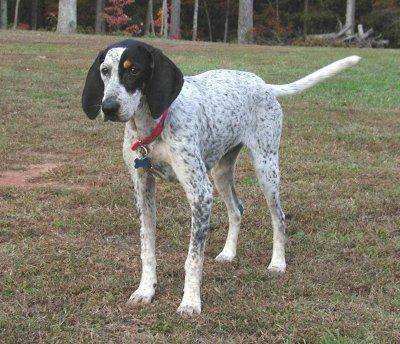

In [ ]:
# Lets view an image
from IPython.display import Image
Image("drive/My Drive/Dog Vision/data/train/00214f311d5d2247d5dfe4fe24b2303d.jpg")

### Getting images and their labels

Lets get a list of all our image file pathnames

In [3]:
# Create pathnames from image ID's
filenames = ["drive/My Drive/Dog Vision/data/train/"+ fname +".jpg" for fname in labels_csv["id"]]

# Check for the first 10
filenames[:10]

['drive/My Drive/Dog Vision/data/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/data/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/data/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/data/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/data/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/data/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/data/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/data/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/data/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [6]:
# Check wether number of filenames match the actual number of image files
import os
if len(os.listdir("drive/My Drive/Dog Vision/data/train")) == len(filenames):
  print("sve 5")
else:
  print("sve ne 5")

OSError: ignored

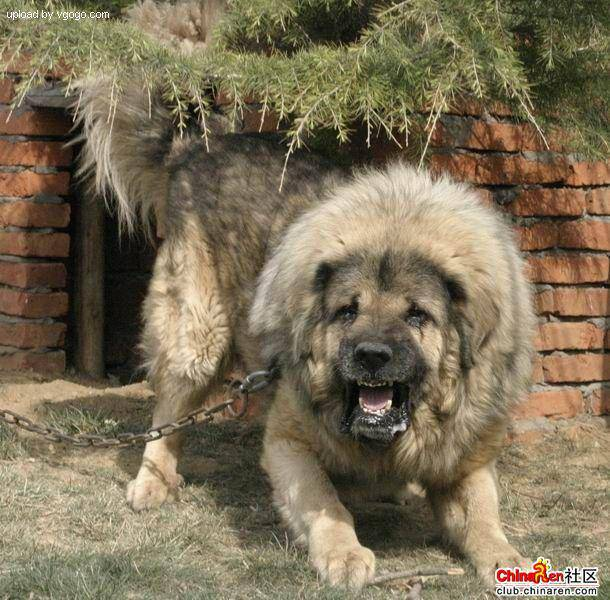

In [ ]:
a=9000
Image(filenames[a])

In [ ]:
print(labels_csv["breed"][a])

tibetan_mastiff


Since we've got training image filepaths in a list, let's prepare our labels.

In [ ]:
labels = np.array(labels_csv["breed"])
labels

In [ ]:
unique_breeds = np.unique(labels)
len(unique_breeds)

In [ ]:
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into boolean array
boolean_labels = [label == unique_breeds for label in labels]
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean array into integers
print (labels[0])
print(np.where(unique_breeds == labels[0])) # Index where the label occurs
print(boolean_labels[0].argmax()) # Index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs


boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


#Creating our own validation set

In [ ]:
# Setup X and Y variables
X = filenames
y = boolean_labels

We are going to start off experimenting with ~1000 images and increase that number as needed

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Splitting the data into train and validation series
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size num_images
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                     y[:NUM_IMAGES],
                                                     test_size=0.2,
                                                     random_state=42)

len(X_train), len(X_val)

(800, 200)

In [ ]:
X_train[:5], y_train[:2]

(['drive/My Drive/Dog Vision/data/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/Dog Vision/data/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/My Drive/Dog Vision/data/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/My Drive/Dog Vision/data/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/My Drive/Dog Vision/data/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False

# Preprocessing images (Turning images into Tensors)
To preprocess our images into Tensors, we are going to make a function that does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable `image`
3. Turn our `image` (jpg) into tensors
4. Normalize our image (Convert color channel values from 0-255 to 0-1)
5. Resize the image to be in shape of (224, 224)
6. Return the modified `image` 

In [ ]:
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [ ]:
# Turning image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

In [22]:
# Making a fucntion to preprocess images into tensors
# Define image size (so they are squared)
IMG_SIZE = 224

def process_image(image_path, img_size=IMG_SIZE):
  """
  1. Take an image filepath as input
  2. Use TensorFlow to read the file and save it to a variable `image`
  3. Turn our `image` (jpg) into tensors
  4. Normalize our image (Convert color channel values from 0-255 to 0-1)
  5. Resize the image to be in shape of (224, 224)
  6. Return the modified `image`
  """
  # Read an image file
  image = tf.io.read_file(image_path)

  # Turn the jpg image into numerical Tensor with 3 colour channels (RGB)
  image = tf.image.decode_jpeg(image, channels=3)

  # Convert the color channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image to our desired size (224, 224)
  image = tf.image.resize(image, size= [IMG_SIZE, IMG_SIZE])

  return image

In [ ]:
# example
tensor = tf.io.read_file(filenames[26])
tensor

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01\xf4\x01w\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [ ]:
# example
tf.image.decode_jpeg(tensor, channels=3)

<tf.Tensor: shape=(500, 375, 3), dtype=uint8, numpy=
array([[[ 59,  68,  65],
        [ 64,  73,  70],
        [ 71,  80,  77],
        ...,
        [115, 128, 108],
        [115, 128, 108],
        [110, 123, 103]],

       [[ 65,  74,  71],
        [ 72,  81,  78],
        [ 79,  88,  85],
        ...,
        [114, 127, 107],
        [117, 130, 110],
        [116, 129, 109]],

       [[ 68,  77,  74],
        [ 76,  85,  82],
        [ 83,  92,  89],
        ...,
        [114, 127, 107],
        [120, 133, 113],
        [123, 136, 116]],

       ...,

       [[173, 200, 155],
        [164, 179, 136],
        [181, 166, 133],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[142, 159, 117],
        [147, 154, 113],
        [189, 174, 141],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[167, 179, 139],
        [167, 172, 132],
        [204, 188, 155],
        ...,
        [255, 255, 25

# Turning our data into batches

Why turn our data into batches?

Let's say you are trying to process 10000+ images in one go... they all might not fit into memory.

So thats why we do about 32 (the usual batch size) images at the time (you can manually adjust the batch size if needed)

In order to use tensorflow effectivly, we need our data in the form of Tensor tuples which look like this:
`(image, label)`.

In [17]:
# Create a function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label
  processes the image and returns a type of (image, label)
  """
  image = process_image(image_path)
  return image, label

In [18]:
# Demo of the function above
(process_image(X[55]), tf.constant(y[55]))

NameError: ignored

Now we've got aa way to turn our data into tuples of tensors in a form: `(image, label)`, lets make a function to turn all our data 
(x&y) into batches.

In [19]:
# Define the batch size
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if its training data but doesn't shuffle if its validation data.
  Also accepts test data as input (no labels).
  """

  # If the data is a test data set, we don't have labels
  if test_data:
    print("Creating test data batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths, no labels
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  
  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  
  else:
    print("Creating data batches")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is fasster then shuffling images.
    data = data.shuffle(buffer_size=len(X))

    # Create image labels tuples (this also turns the image path into a preprossed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

  return data_batch

In [21]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

NameError: ignored

In [ ]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing data batches
Our data is now in batches, however, these can be a little hard to comprehend, lets visualize them

In [9]:
import matplotlib.pyplot as plt

# Create a function for viewing images in data batches

def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  # Setup the figure
  plt.figure(figsize=(10,10))
  
  # Loop through 25 images
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)

    # Display an image
    plt.imshow(images[i])

    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])

    # Turn the grid off
    plt.axis("off")

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels)

(32, 32)

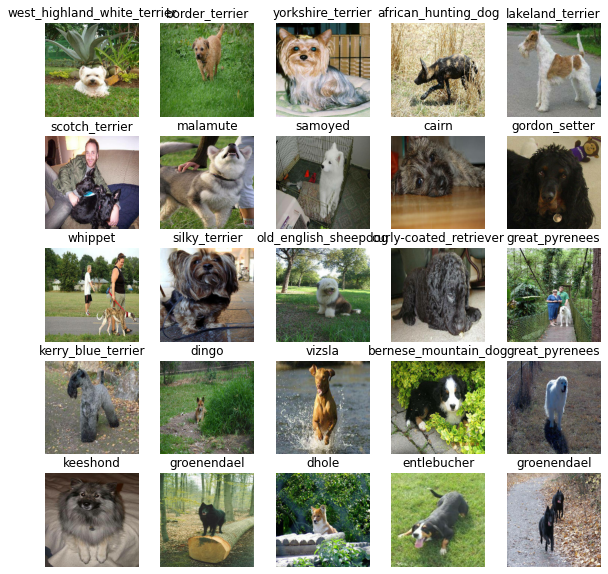

In [ ]:
# Now lets visualize the data in a training batch
show_25_images(train_images, train_labels)

In [7]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

NameError: ignored

# Building a model

Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels in the form of Tensors) of our model.
* The URL that we want to use.

In [11]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, color channels

# Setup the output shape
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

NameError: ignored

Now we've got inputs, outputs and model ready to go. Lets put them together into Keras deep learning model.

Knowing this, lets make a function which:
* Takes the input shape, output shape and the model we've choosen as parameters.
* Defines the layers in Keras model in sequential fashon (First do this, than that, than that...).
* Compiles the model (says it should be evaluated and improved)
* Builds the model (tells the model the input shape it'll be getting)
* Returns the model



All of these steps can be found here: https://www.tensorflow.org/guide/keras/sequential_model

In [13]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

NameError: ignored

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer_2 (KerasLayer)   (None, 1001)              5432713   
_________________________________________________________________
dense_2 (Dense)              (None, 120)               120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callback functions

Callback functions are helper function that a model can use during training to do such things as saving its progress, check its progrss or stop the training if the model stops improving.

We'll create two callback functions: one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

### TensorBoard callback
To setup TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard extention
2. Create a TensorBoard callback which is able to save logs into directory and pass it to our models fir() function
3. Visualize our models training logs with TensorBoard `magic()` function

In [ ]:
# Load TensorBoard extention
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/My Drive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callback

Early stopping helps our model from overfitting by stopping training if a certain evaluation stops improving.



In [ ]:
# Create early sstopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

# Training a model (on a data subset)
Our first model will be trained on 1000 pictures only, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Check to make sure we are still running on GPU
print("GPU", "avalibel" if tf.config.list_physical_devices("GPU") else "not avalebl :(")

GPU avalibel


Lets create a function which trains a model

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (NUM_EPOCHS) and the callbacks we'd like to use
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version
  """
  # Create a model
  model = create_model()

  # Create a new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitting data
  return model

In [ ]:
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
 2/25 [=>............................] - ETA: 6s - loss: 5.3338 - accuracy: 0.0156WARNING:tensorflow:Callbacks method `on_train_batch_end` is slow compared to the batch time (batch time: 0.0941s vs `on_train_batch_end` time: 0.4840s). Check your callbacks.


25/25 [==============================] - 5s 197ms/step - loss: 4.6094 - accuracy: 0.0913 - val_loss: 3.5533 - val_accuracy: 0.2150
Epoch 2/100
25/25 [==============================] - 4s 174ms/step - loss: 1.6406 - accuracy: 0.6875 - val_loss: 2.1978 - val_accuracy: 0.5400
Epoch 3/100
25/25 [==============================] - 4s 174ms/step - loss: 0.5700 - accuracy: 0.9375 - val_loss: 1.6746 - val_accuracy: 0.6100
Epoch 4/100
25/25 [==============================] - 4s 177ms/step - loss: 0.2591 - accuracy: 0.9862 - val_loss: 1.4812 - val_accuracy: 0.6400
Epoch 5/100
25/25 [==============================] - 4s 173ms/step - loss: 0.1492 - accuracy: 0.9962 - val_loss: 1.3892 - val_accuracy: 0.6500
Epoch 6/100
25/25 [==============================] - 4s 176ms/step - loss: 0.1011 - accuracy: 1.0000 - val_loss: 1.3452 - val_accuracy: 0.6500
Epoch 7/100
25/25 [==============================] - 4s 173ms/step - loss: 0.0756 - accuracy: 1.0000 - val_loss: 1.3217 - val_accuracy: 0.6500
Epoch 8/100

 ### Checking the TensorBoard logs

 The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlyer and visaulize its contents.

In [ ]:
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/logs

Output hidden; open in https://colab.research.google.com to view.

## Making and evaluationg predictions using a trained model

In [ ]:
# Make predictions on validation data
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 107ms/step


array([[7.50799314e-04, 2.69792392e-04, 6.21989719e-04, ...,
        5.70607372e-04, 2.40199399e-04, 4.25541960e-03],
       [3.02864914e-03, 2.41777208e-03, 6.87431693e-02, ...,
        7.57083239e-04, 2.32521421e-03, 1.09074533e-03],
       [8.47674237e-05, 7.99111949e-05, 2.37326763e-04, ...,
        2.38418033e-05, 1.28070431e-04, 4.91705583e-03],
       ...,
       [9.40182508e-05, 2.93656078e-04, 1.07940068e-04, ...,
        1.69135783e-05, 7.13404617e-04, 1.61277130e-03],
       [2.45404802e-03, 1.53656758e-04, 3.22287175e-04, ...,
        1.00028614e-04, 4.75658417e-05, 5.91646461e-03],
       [1.32605713e-03, 2.94715610e-05, 5.63396134e-05, ...,
        3.04290629e-03, 1.13024865e-03, 1.67005826e-04]], dtype=float32)

In [ ]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probabilty of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[2.78359337e-04 8.00208654e-05 2.03186923e-04 9.76196607e-05
 5.51364152e-03 2.01101371e-04 1.80928240e-04 1.14915252e-03
 1.74584854e-02 2.96966024e-02 6.24234781e-06 1.82142448e-05
 4.19746008e-04 8.64376593e-03 8.48171068e-04 2.10747798e-03
 8.45369286e-05 1.80412360e-04 2.58733839e-04 2.79727322e-03
 2.95778373e-05 4.54927038e-04 7.65257137e-05 7.97072134e-05
 1.33733861e-02 4.60073643e-05 1.15689581e-05 1.28896048e-04
 9.88994958e-04 1.68158629e-04 2.44884024e-04 2.61665409e-04
 9.53502094e-05 4.53991779e-05 2.51894817e-05 4.21767145e-05
 1.71069885e-04 1.08716020e-03 3.25131950e-05 3.22843701e-01
 3.14212492e-04 5.00346960e-06 2.01814622e-03 9.43710620e-06
 1.07023958e-03 6.66867854e-05 5.41447778e-04 1.94639200e-03
 3.99849305e-05 5.81260247e-04 3.16631602e-04 9.76957454e-05
 4.25579783e-04 5.44303516e-03 1.39648118e-05 3.44224682e-04
 2.67389754e-04 8.16314277e-05 1.73309047e-04 2.84516154e-05
 1.90527251e-04 2.78241234e-03 3.42308485e-05 3.28555325e-05
 6.73942850e-05 1.285634

Having the above functionality is great but we want to do this on a scale.

It would be better if we could see the image the prediction is being made on.

**Note: ** Prediction probabilities are also known as confidance level.

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of predictions into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probablities
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

In [ ]:
val_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

Since our validation data is in batch set, we will have to unbatchify it to make predictions on validation images and then compare those predictions to truth labels (validatoin data).


In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and reutrns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we have awys to get:
* Preiction labels
* Validation labels (truth labels)
* Validation images 

Lets make some functions to make this a bit more visual.

We will create a function which:
* Takes an array of prediction probabillities, an array of truth labels and an array of images and integers.
* Convert the prediction probabillities to a predicted label and plot predicted label, its predicted probability, the truth label and the target on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks 
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the predictions is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, label probability of prediction and truth label
  plt.title("{} {:2.0f} {}".format(pred_label,
                                   np.max(pred_prob)*100,
                                   true_label),
                                   color=color)

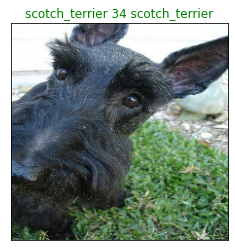

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images)

Now we've got a fucntion to visualuze our model predicitons. 

Lets make another function to view our model top 10 predictions.

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer.
* Find the prediction label using `get_pred_label()`
* Find the top 10:
  * Prediction probabilities
  * Prediction probabilities values
  * Prediciton labels
* Plot the top 10 prediciton probality values and labels, coloring the true label green.

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plot the top 10 highest prediciton confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidance indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediciton confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Fint the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation="vertical")
  
  # Change the color of true labels
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

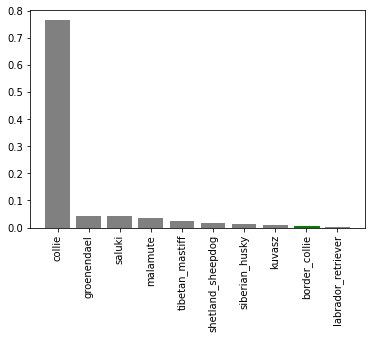

In [ ]:
 plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=9)

Now we've  got some functions to help us visualize our predictions and evaluate our model, lets checkk out a few.

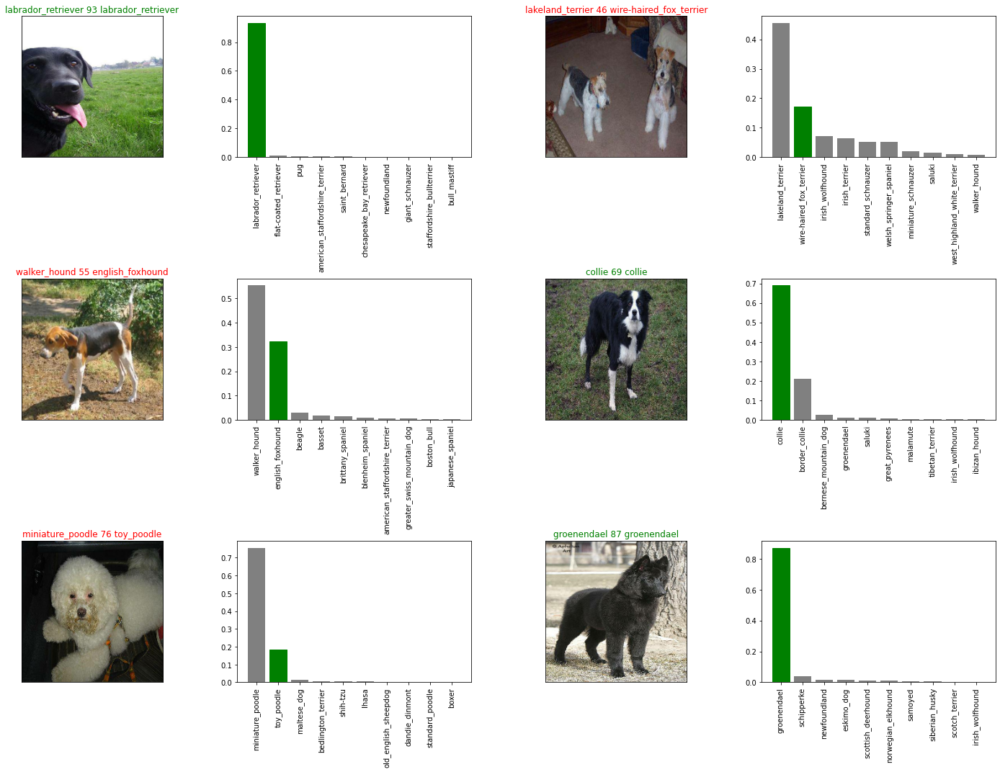

In [ ]:
i_multiplier = 40
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

# Saving and loading a model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/My Drive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [2]:
# Create a function to load a model
def load_model(model_path):
  """
  Loads a saved model from a specified path
  """
  print(f"Loading saved model from {model_path}...")
  model = tf.keras.models.load_model(model_path, custom_objects={"KerasLayer": hub.KerasLayer})
  return model

Now we've got functions to save and load a model, lets make sure they work

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetV2-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20200824-11161598267805-1000-images-mobilenetV2-Adam.h5...


'drive/My Drive/Dog Vision/models/20200824-11161598267805-1000-images-mobilenetV2-Adam.h5'

In [ ]:
loaded_1000_image_model = load_model("drive/My Drive/Dog Vision/models/20200824-11161598267805-1000-images-mobilenetV2-Adam.h5")

Loading saved model from drive/My Drive/Dog Vision/models/20200824-11161598267805-1000-images-mobilenetV2-Adam.h5...


In [ ]:
# Evaluate the presaved model
model.evaluate(val_data)

7/7 [==============================] - 1s 96ms/step - loss: 1.2421 - accuracy: 0.6700


[1.2421379089355469, 0.6700000166893005]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 76s 11s/step - loss: 1.2421 - accuracy: 0.6700


[1.2421379089355469, 0.6700000166893005]

# Training a big dog model

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Create a data batch with a full data set
full_data = create_data_batches(X, y)

Creating data batches


In [ ]:
full_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
full_model=create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we cant monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [ ]:
# Fit the model to the full data
full_model.fit(x=full_data,
               epochs=100,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
  1/320 [..............................] - ETA: 0s - loss: 5.4363 - accuracy: 0.0000e+00WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.


Instructions for updating:
use `tf.profiler.experimental.stop` instead.


320/320 [==============================] - 4593s 14s/step - loss: 1.3683 - accuracy: 0.6673
Epoch 2/100
320/320 [==============================] - 52s 161ms/step - loss: 0.3990 - accuracy: 0.8820
Epoch 3/100
320/320 [==============================] - 51s 160ms/step - loss: 0.2376 - accuracy: 0.9357
Epoch 4/100
320/320 [==============================] - 51s 158ms/step - loss: 0.1533 - accuracy: 0.9646
Epoch 5/100
320/320 [==============================] - 45s 140ms/step - loss: 0.1060 - accuracy: 0.9786
Epoch 6/100
320/320 [==============================] - 41s 128ms/step - loss: 0.0787 - accuracy: 0.9850
Epoch 7/100
320/320 [==============================] - 42s 130ms/step - loss: 0.0590 - accuracy: 0.9911
Epoch 8/100
320/320 [==============================] - 48s 150ms/step - loss: 0.0465 - accuracy: 0.9938
Epoch 9/100
320/320 [==============================] - 51s 158ms/step - loss: 0.0370 - accuracy: 0.9962
Epoch 10/100
320/320 [==============================] - 51s 160ms/step - los

In [ ]:
save_model(full_model, suffix="Big_data_model")

Saving model to: drive/My Drive/Dog Vision/models/20200824-19231598296995-Big_data_model.h5...


'drive/My Drive/Dog Vision/models/20200824-19231598296995-Big_data_model.h5'

In [3]:
full_model = load_model("drive/My Drive/Dog Vision/models/20200824-19231598296995-Big_data_model.h5")

Loading saved model from drive/My Drive/Dog Vision/models/20200824-19231598296995-Big_data_model.h5...


# Making predictions on full data set

Since our model has been train on images in the form of Tensor batches, to make predictions on the test data, we'll have to get into the same format.

We created a function `create_data_batches()` earlier which can take a list of filenames as input and convert them into tensor batches.

To make predictions on test data:
* Get the test image file names
* Convert the filenames into test data batches using `create_data_batches()` and setting the test data parameter to "True" (Since our test data does not have labels).
* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [7]:
# Load tesst image file names 
import os
test_path = "drive/My Drive/Dog Vision/data/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/My Drive/Dog Vision/data/test/e8889cf9d7b2701a85be1c97661b9b26.jpg',
 'drive/My Drive/Dog Vision/data/test/e85d4e2707683df0e6387e19b67b873d.jpg',
 'drive/My Drive/Dog Vision/data/test/f11821f2a5777c36a4081588fb96798f.jpg',
 'drive/My Drive/Dog Vision/data/test/efac70ee513c40265966b89d715f183e.jpg',
 'drive/My Drive/Dog Vision/data/test/e9f25d81c8fa96020a77a1f3148d0d3c.jpg',
 'drive/My Drive/Dog Vision/data/test/eb9e89f5c0f1717f290360fec6f2a160.jpg',
 'drive/My Drive/Dog Vision/data/test/f53aa47b4676b1f135ac2eeeee01db9b.jpg',
 'drive/My Drive/Dog Vision/data/test/ed48b89faa9069c700db2448696a97af.jpg',
 'drive/My Drive/Dog Vision/data/test/ee59d7c0fdd2344e9d6d815f1099ffb1.jpg',
 'drive/My Drive/Dog Vision/data/test/ee0f518cd7eb01b2b774f3d2329e58f9.jpg']

In [23]:
len(test_filenames)

10357

In [24]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches


In [25]:
test_data

<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [ ]:
# # Make predictions on test data batch using the full model
# test_predictions = full_model.predict(test_data,
#                                       verbose=1)
# dugo traje

In [26]:
test_predictions = pd.read_csv("/content/drive/My Drive/Dog Vision/data/predictions.csv")

In [28]:
test_predictions.shape

(1071, 120)